In [2]:
pip install networkx

Note: you may need to restart the kernel to use updated packages.


تعداد نودها: 2892
تعداد یال‌ها: 3475


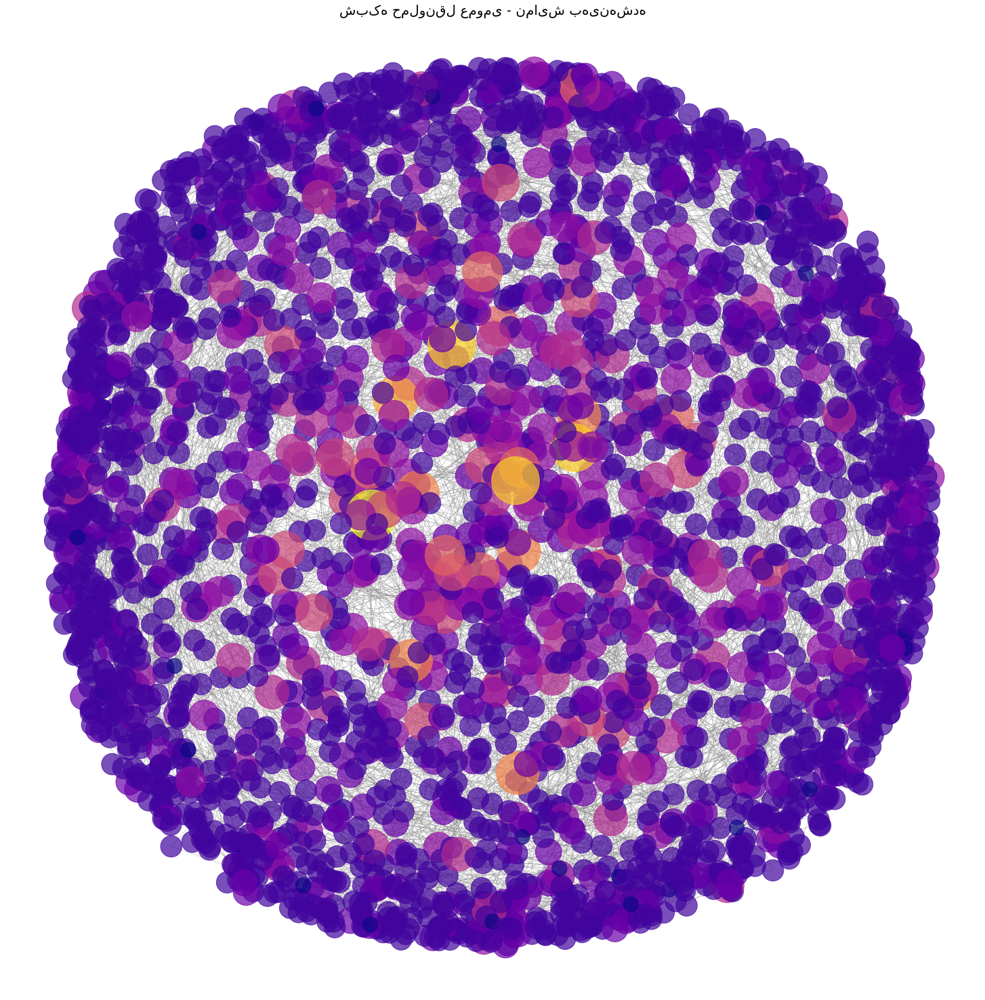

In [2]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
import random

stop_times = pd.read_csv('gtfs/stop_times.txt')
trips = pd.read_csv('gtfs/trips.txt')
stops = pd.read_csv('gtfs/stops.txt')

# =====================================
nodes = stops['stop_id'].tolist()

merged = pd.merge(stop_times, trips, on='trip_id')
edges = []
for trip in merged['trip_id'].unique():
    stops_in_trip = merged[merged['trip_id'] == trip].sort_values('stop_sequence')
    stops_in_trip = stops_in_trip.drop_duplicates(subset=['stop_id'])  # حذف توقف‌های تکراری در یک سفر
    for i in range(len(stops_in_trip)-1):
        edges.append((
            stops_in_trip.iloc[i]['stop_id'],
            stops_in_trip.iloc[i+1]['stop_id']
        ))

edges = list(set(edges))

G = nx.Graph()
G.add_nodes_from(nodes)
G.add_edges_from(edges)

print("تعداد نودها:", G.number_of_nodes())
print("تعداد یال‌ها:", G.number_of_edges())

# ================================
plt.figure(figsize=(20, 20))  # افزایش اندازه تصویر

# 1. استفاده از Layout بهینه
pos = nx.spring_layout(G, k=0.3, iterations=50, seed=42)  # افزایش فاصله بین نودها

degree_cent = nx.degree_centrality(G)
node_colors = [degree_cent[n] * 1000 for n in G.nodes()]

node_sizes = [d * 500 for n, d in G.degree()]

labels = {n: n if degree_cent[n] > 0.01 else "" for n in G.nodes()}

nx.draw(
    G,
    pos,
    node_color=node_colors,
    node_size=node_sizes,
    cmap=plt.cm.plasma,
    edge_color="grey",
    alpha=0.7,
    with_labels=True,
    labels=labels,
    font_size=8,
    font_color="black",
    width=0.5,
)

plt.title("شبکه حملونقل عمومی - نمایش بهینه‌شده", fontsize=20)
plt.savefig("transport_network.png", dpi=300, bbox_inches="tight")
plt.show()

In [6]:
import pandas as pd
import networkx as nx

def time_to_seconds(time_str):
    try:
        h, m, s = map(int, time_str.split(':'))
        return h * 3600 + m * 60 + s
    except:
        return None

gtfs_folder = 'gtfs'
stops_file      = f"{gtfs_folder}/stops.txt"
stop_times_file = f"{gtfs_folder}/stop_times.txt"
trips_file      = f"{gtfs_folder}/trips.txt"
calendar_file   = f"{gtfs_folder}/calendar.txt"

stops      = pd.read_csv(stops_file)
stop_times = pd.read_csv(stop_times_file)
trips      = pd.read_csv(trips_file)
calendar   = pd.read_csv(calendar_file)

service_day_map = {}
for _, row in calendar.iterrows():
    sid = row['service_id']
    if row['sunday'] == 1:
        service_day_map[sid] = 'sunday'
    elif row['saturday'] == 1:
        service_day_map[sid] = 'saturday'
    else:
        service_day_map[sid] = 'weekday'

graph_template = nx.DiGraph()
for _, row in stops.iterrows():
    graph_template.add_node(
        row['stop_id'],
        stop_name=row.get('stop_name',''),
        lat=row.get('stop_lat',None),
        lon=row.get('stop_lon',None)
    )

time_sorted = stop_times.sort_values(['trip_id','stop_sequence']).reset_index(drop=True)

time_snapshots = {}

for trip_id, grp in time_sorted.groupby('trip_id'):
    grp = grp.sort_values('stop_sequence').reset_index(drop=True)
    sid = trips.loc[trips['trip_id']==trip_id, 'service_id'].iloc[0]
    day_type = service_day_map.get(sid, 'weekday')
    for i in range(len(grp)-1):
        cur = grp.iloc[i]
        nxt = grp.iloc[i+1]
        dep_sec = time_to_seconds(cur['departure_time'])
        arr_sec = time_to_seconds(nxt['arrival_time'])
        if dep_sec is None or arr_sec is None:
            continue
        # تعیین ساعت (0-23)
        hour = (dep_sec // 3600) % 24
        key = (day_type, hour)
        if key not in time_snapshots:
            G = nx.DiGraph()
            for n, data in graph_template.nodes(data=True):
                G.add_node(n, **data)
            time_snapshots[key] = G
        G = time_snapshots[key]
        src, dst = cur['stop_id'], nxt['stop_id']
        travel_time = arr_sec - dep_sec
        if G.has_edge(src, dst):
            G[src][dst]['trip_count'] += 1
            G[src][dst]['time_sum'] += travel_time
        else:
            G.add_edge(src, dst,
                       trip_count=1,
                       time_sum=travel_time)

for G in time_snapshots.values():
    for u, v, data in G.edges(data=True):
        data['avg_travel_time'] = data['time_sum'] / data['trip_count']

print("ساخته‌شده snapshot برای هر روز و ساعت:")
for (day, hour), G in sorted(time_snapshots.items()):
    print(f"{day.capitalize():9s}, hour={hour:02d}: nodes={G.number_of_nodes():4d}, edges={G.number_of_edges():4d}")

    fname = f"gtfs_snapshot_{day}_hour_{hour:02d}.graphml"
    nx.write_graphml(G, fname)
    print(f"ذخیره شد: {fname}")


ساخته‌شده snapshot برای هر روز و ساعت:
Saturday , hour=00: nodes=2892, edges= 582
ذخیره شد: gtfs_snapshot_saturday_hour_00.graphml
Saturday , hour=01: nodes=2892, edges= 236
ذخیره شد: gtfs_snapshot_saturday_hour_01.graphml
Saturday , hour=02: nodes=2892, edges=  79
ذخیره شد: gtfs_snapshot_saturday_hour_02.graphml
Saturday , hour=03: nodes=2892, edges=  18
ذخیره شد: gtfs_snapshot_saturday_hour_03.graphml
Saturday , hour=04: nodes=2892, edges= 159
ذخیره شد: gtfs_snapshot_saturday_hour_04.graphml
Saturday , hour=05: nodes=2892, edges= 676
ذخیره شد: gtfs_snapshot_saturday_hour_05.graphml
Saturday , hour=06: nodes=2892, edges=1428
ذخیره شد: gtfs_snapshot_saturday_hour_06.graphml
Saturday , hour=07: nodes=2892, edges=1767
ذخیره شد: gtfs_snapshot_saturday_hour_07.graphml
Saturday , hour=08: nodes=2892, edges=1908
ذخیره شد: gtfs_snapshot_saturday_hour_08.graphml
Saturday , hour=09: nodes=2892, edges=2115
ذخیره شد: gtfs_snapshot_saturday_hour_09.graphml
Saturday , hour=10: nodes=2892, edges=207

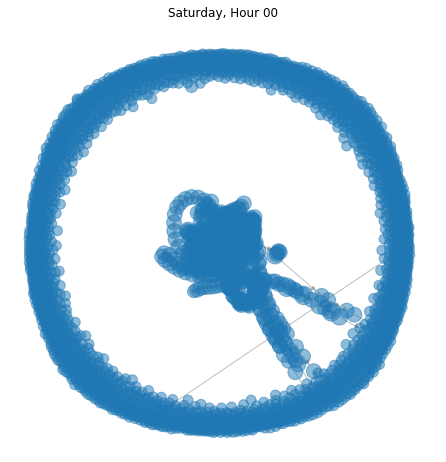

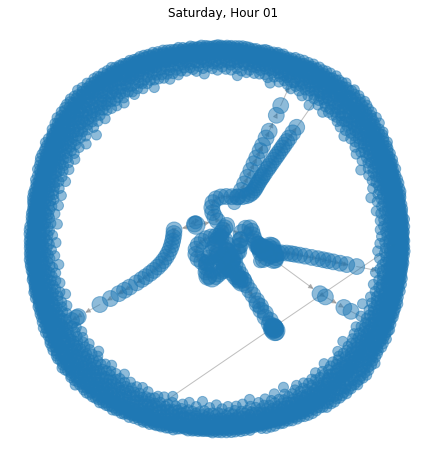

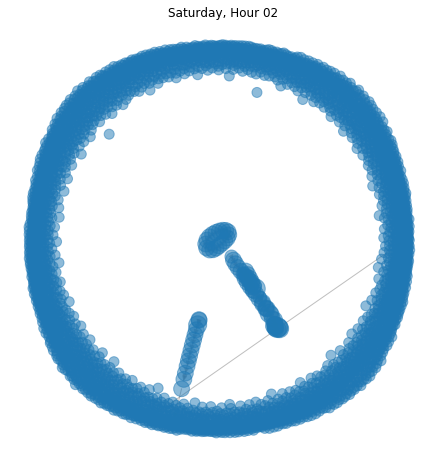

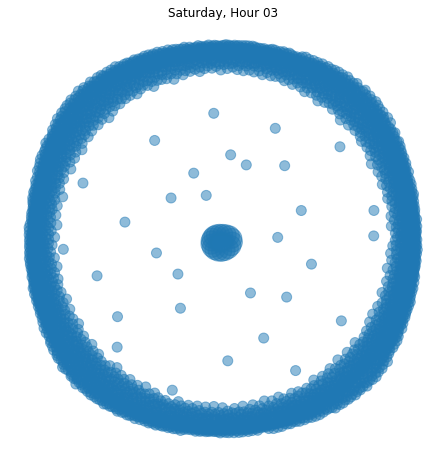

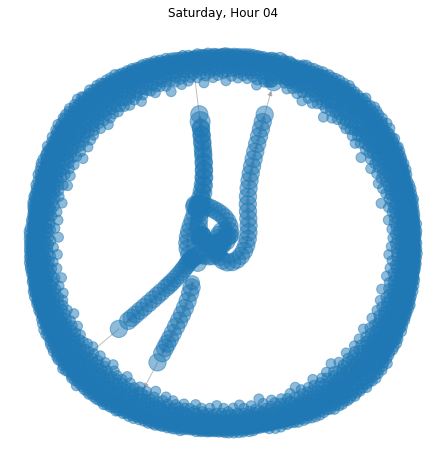

...

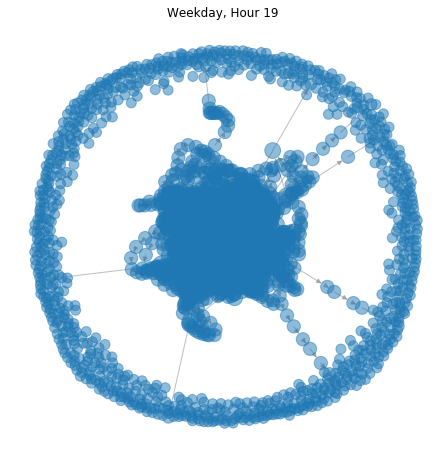

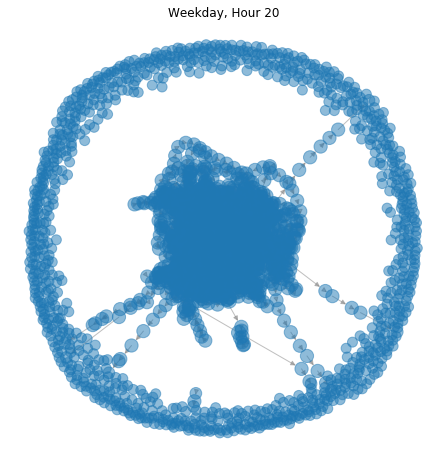

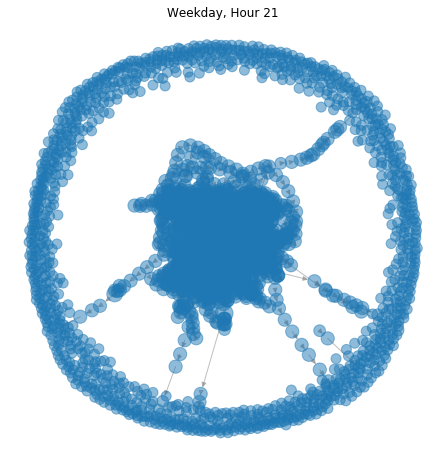

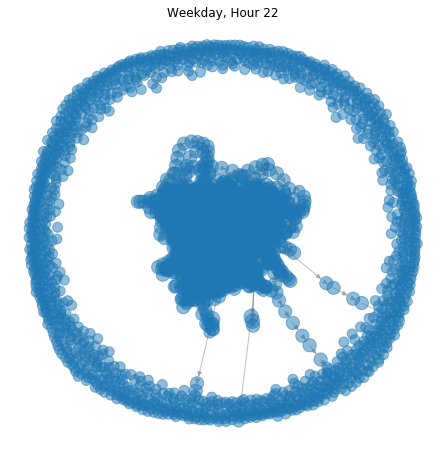

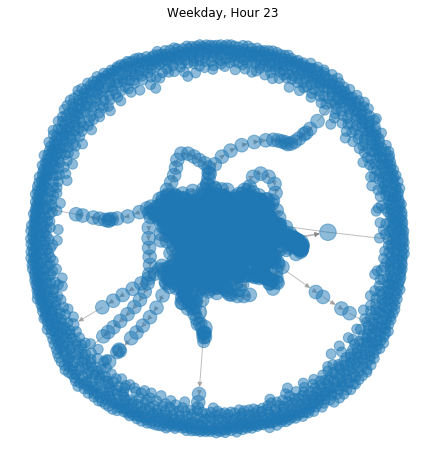

In [8]:
import os
import glob
import networkx as nx
import matplotlib.pyplot as plt

files = sorted(glob.glob('gtfs_snapshot_*_hour_*.graphml'))

snapshots = {}
for fn in files:
    G = nx.read_graphml(fn)
    basename = os.path.basename(fn)
    parts = basename.replace('.graphml','').split('_')
    day = parts[2]
    hour = int(parts[4])
    snapshots[(day, hour)] = G

for (day, hour), G in sorted(snapshots.items()):
    plt.figure(figsize=(6,6))
    pos = nx.spring_layout(G, seed=42)
    deg = dict(G.degree())
    maxd = max(deg.values()) or 1
    sizes = [(deg[n]/maxd)*300 + 100 for n in G.nodes()]
    nx.draw(G, pos,
            node_size=sizes,
            with_labels=False,
            edge_color='gray',
            alpha=0.5)
    plt.title(f"{day.capitalize()}, Hour {hour:02d}")
    plt.axis('off')
    plt.show()


Aggregated Graph: Nodes=2892, Edges=3501


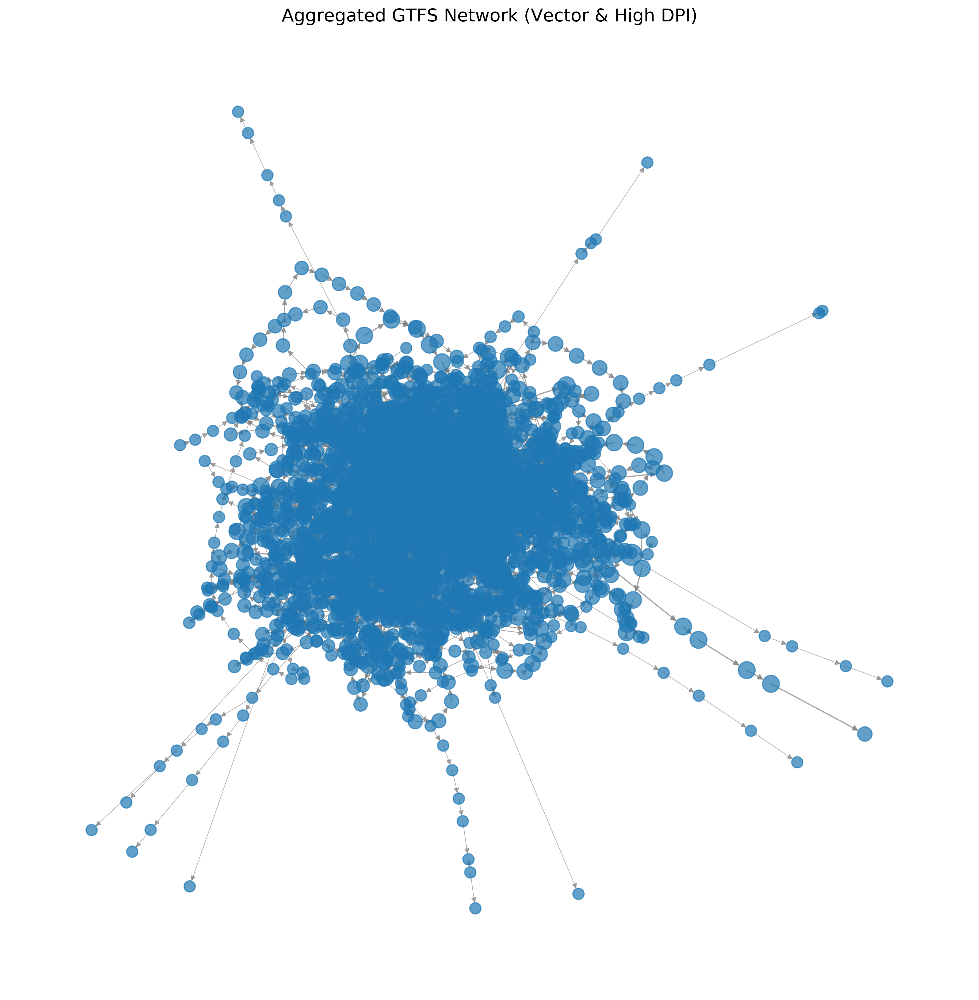

Saved: PNG, SVG, and GraphML files


In [9]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

def time_to_seconds(time_str):
    try:
        h, m, s = map(int, time_str.split(':'))
        return h * 3600 + m * 60 + s
    except:
        return None

gtfs_folder = 'gtfs'
stops_file      = f"{gtfs_folder}/stops.txt"
stop_times_file = f"{gtfs_folder}/stop_times.txt"
trips_file      = f"{gtfs_folder}/trips.txt"
calendar_file   = f"{gtfs_folder}/calendar.txt"

stops      = pd.read_csv(stops_file)
stop_times = pd.read_csv(stop_times_file)
trips      = pd.read_csv(trips_file)
calendar   = pd.read_csv(calendar_file)

day_map = {}
for _, r in calendar.iterrows():
    sid = r['service_id']
    if r['sunday'] == 1:
        day_map[sid] = 'sunday'
    elif r['saturday'] == 1:
        day_map[sid] = 'saturday'
    else:
        day_map[sid] = 'weekday'

template = nx.DiGraph()
for _, r in stops.iterrows():
    template.add_node(r['stop_id'], stop_name=r['stop_name'], lat=r['stop_lat'], lon=r['stop_lon'])

times = stop_times.sort_values(['trip_id','stop_sequence']).reset_index(drop=True)

snapshots = {}  # key = (day_type, hour)
for tid, grp in times.groupby('trip_id'):
    grp = grp.sort_values('stop_sequence')
    sid = trips.loc[trips['trip_id']==tid, 'service_id'].iloc[0]
    day = day_map.get(sid, 'weekday')
    for i in range(len(grp)-1):
        cur, nxt = grp.iloc[i], grp.iloc[i+1]
        d_sec = time_to_seconds(cur['departure_time'])
        a_sec = time_to_seconds(nxt['arrival_time'])
        if d_sec is None or a_sec is None: continue
        hr = (d_sec // 3600) % 24
        key = (day, hr)
        if key not in snapshots:
            G = nx.DiGraph()
            for n, data in template.nodes(data=True):
                G.add_node(n, **data)
            snapshots[key] = G
        G = snapshots[key]
        src, dst = cur['stop_id'], nxt['stop_id']
        travel = a_sec - d_sec
        if G.has_edge(src, dst):
            G[src][dst]['trip_count'] += 1
            G[src][dst]['time_sum'] += travel
        else:
            G.add_edge(src, dst, trip_count=1, time_sum=travel)

# محاسبه avg_travel_time
for G in snapshots.values():
    for u, v, d in G.edges(data=True):
        d['avg_travel_time'] = d['time_sum'] / d['trip_count']

agg_graph = nx.DiGraph()
for n, data in template.nodes(data=True):
    agg_graph.add_node(n, **data)
for G in snapshots.values():
    for u, v, d in G.edges(data=True):
        cnt, tsum = d['trip_count'], d['time_sum']
        if agg_graph.has_edge(u, v):
            agg_graph[u][v]['trip_count'] += cnt
            agg_graph[u][v]['time_sum'] += tsum
        else:
            agg_graph.add_edge(u, v, trip_count=cnt, time_sum=tsum)
for u, v, d in agg_graph.edges(data=True):
    d['avg_travel_time'] = d['time_sum'] / d['trip_count']

print(f"Aggregated Graph: Nodes={agg_graph.number_of_nodes()}, Edges={agg_graph.number_of_edges()}")

deg = dict(agg_graph.degree(weight='trip_count'))
max_deg = max(deg.values()) or 1
node_sizes = [(deg[n]/max_deg)*1000 + 100 for n in agg_graph.nodes()]
edge_weights = [d['trip_count'] for _,_,d in agg_graph.edges(data=True)]
max_w = max(edge_weights) or 1
edge_widths = [0.5 + 4.5*(w/max_w) for w in edge_weights]

plt.figure(figsize=(12, 12), dpi=300)
pos = nx.spring_layout(agg_graph, seed=42)
nx.draw(
    agg_graph,
    pos,
    node_size=node_sizes,
    edge_color='gray',
    width=edge_widths,
    alpha=0.7,
    with_labels=False
)
plt.title('Aggregated GTFS Network (Vector & High DPI)', fontsize=16)
plt.axis('off')
plt.savefig('gtfs_aggregated_weighted.png', dpi=600, bbox_inches='tight')
plt.savefig('gtfs_aggregated_weighted.svg', format='svg', bbox_inches='tight')
plt.show()

# ذخیره GraphML
tx = nx.write_graphml(agg_graph, 'gtfs_aggregated.graphml')
print("Saved: PNG, SVG, and GraphML files")


In [12]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import json

def time_to_seconds(time_str):
    try:
        h, m, s = map(int, time_str.split(':'))
        return h * 3600 + m * 60 + s
    except:
        return None

# مسیر فایل‌های GTFS
gtfs_folder = 'gtfs'
stops_file      = f"{gtfs_folder}/stops.txt"
stop_times_file = f"{gtfs_folder}/stop_times.txt"
trips_file      = f"{gtfs_folder}/trips.txt"
calendar_file   = f"{gtfs_folder}/calendar.txt"

# خواندن داده‌ها
stops      = pd.read_csv(stops_file)
stop_times = pd.read_csv(stop_times_file)
trips      = pd.read_csv(trips_file)
calendar   = pd.read_csv(calendar_file)

# نگاشت service_id به نوع روز
day_map = {}
for _, r in calendar.iterrows():
    sid = r['service_id']
    if r['sunday'] == 1:
        day_map[sid] = 'sunday'
    elif r['saturday'] == 1:
        day_map[sid] = 'saturday'
    else:
        day_map[sid] = 'weekday'

# ساخت قالب نودها
template = nx.DiGraph()
for _, r in stops.iterrows():
    template.add_node(
        r['stop_id'],
        stop_name=r['stop_name'],
        lat=r['stop_lat'],
        lon=r['stop_lon']
    )

# مرتب‌سازی stop_times بر اساس trip_id و stop_sequence
times = stop_times.sort_values(['trip_id','stop_sequence']).reset_index(drop=True)

# دیکشنری برای نگهداری گراف‌های پویا: key = (day_type, hour)
snapshots = {}

# ساخت یال‌ها با وزن بر اساس trip_count و time_sum
for tid, grp in times.groupby('trip_id'):
    grp = grp.sort_values('stop_sequence')
    sid = trips.loc[trips['trip_id'] == tid, 'service_id'].iloc[0]
    day = day_map.get(sid, 'weekday')
    for i in range(len(grp) - 1):
        cur = grp.iloc[i]
        nxt = grp.iloc[i+1]
        dep_sec = time_to_seconds(cur['departure_time'])
        arr_sec = time_to_seconds(nxt['arrival_time'])
        if dep_sec is None or arr_sec is None:
            continue
        hour = (dep_sec // 3600) % 24
        key = (day, hour)
        if key not in snapshots:
            G = nx.DiGraph()
            for n, data in template.nodes(data=True):
                G.add_node(n, **data)
            snapshots[key] = G
        G = snapshots[key]
        src = cur['stop_id']
        dst = nxt['stop_id']
        travel_time = arr_sec - dep_sec
        if G.has_edge(src, dst):
            G[src][dst]['trip_count'] += 1
            G[src][dst]['time_sum'] += travel_time
        else:
            G.add_edge(src, dst, trip_count=1, time_sum=travel_time)

# محاسبه avg_travel_time برای هر اسلایس
def compute_avg(G):
    for u, v, data in G.edges(data=True):
        data['avg_travel_time'] = data['time_sum'] / data['trip_count']

for G in snapshots.values():
    compute_avg(G)

# --- تجمیع همه‌ی اسلایس‌ها در یک گراف واحد ---
agg_graph = nx.DiGraph()
# افزودن نودها
for n, data in template.nodes(data=True):
    agg_graph.add_node(n, **data)
# تجمیع یال‌ها
for G in snapshots.values():
    for u, v, data in G.edges(data=True):
        cnt = data['trip_count']
        tsum = data['time_sum']
        if agg_graph.has_edge(u, v):
            agg_graph[u][v]['trip_count'] += cnt
            agg_graph[u][v]['time_sum'] += tsum
        else:
            agg_graph.add_edge(u, v, trip_count=cnt, time_sum=tsum)
# محاسبه avg_travel_time برای گراف تجمیعی
compute_avg(agg_graph)

# نمایش خلاصه گراف تجمیعی
print(f"Aggregated Graph: Nodes={agg_graph.number_of_nodes()}, Edges={agg_graph.number_of_edges()}")

g_und = agg_graph.to_undirected()
metrics = {}
# مشخصات کلی
metrics['num_nodes'] = g_und.number_of_nodes()
metrics['num_edges'] = g_und.number_of_edges()
metrics['density'] = nx.density(g_und)
# مولفه‌های متصل
metrics['num_components'] = nx.number_connected_components(g_und)
largest_cc = max(nx.connected_components(g_und), key=len)
metrics['size_largest_cc'] = len(largest_cc)
# مختصات کوتاه‌ترین مسیر و قطر
sub = g_und.subgraph(largest_cc)
metrics['avg_shortest_path'] = nx.average_shortest_path_length(sub)
metrics['diameter'] = nx.diameter(sub)
# خوشه‌بندی
metrics['avg_clustering'] = nx.average_clustering(g_und)
metrics['transitivity'] = nx.transitivity(g_und)
# توزیع درجه
deg_seq = [d for _, d in g_und.degree()]
metrics['degree_distribution'] = pd.Series(deg_seq).value_counts().sort_index().to_dict()
# همبستگی درجه
metrics['degree_assortativity'] = nx.degree_assortativity_coefficient(g_und)
# مرکزیت‌ها
metrics['degree_centrality'] = nx.degree_centrality(g_und)
metrics['betweenness_centrality'] = nx.betweenness_centrality(g_und)
metrics['closeness_centrality'] = nx.closeness_centrality(g_und)
metrics['eigenvector_centrality'] = nx.eigenvector_centrality_numpy(g_und)

print("--- Network Metrics (Barabasi Chap.2) ---")
for k, v in metrics.items():
    if isinstance(v, dict):
        print(f"{k}: dictionary with {len(v)} items")
    else:
        print(f"{k}: {v}")

pd.Series({k: v for k, v in metrics.items() if not isinstance(v, dict)}).to_csv('metrics_summary.csv')
with open('metrics_all.json', 'w') as f:
    json.dump(metrics, f, indent=2)
print("Network metrics saved.")


Aggregated Graph: Nodes=2892, Edges=3501
--- Network Metrics (Barabasi Chap.2) ---
num_nodes: 2892
num_edges: 3475
density: 0.0008312629503591295
num_components: 2
size_largest_cc: 2671
avg_shortest_path: 24.526543524076747
diameter: 94
avg_clustering: 0.03741405359662618
transitivity: 0.06448461162677088
degree_distribution: dictionary with 12 items
degree_assortativity: 0.29580110664891185
degree_centrality: dictionary with 2892 items
betweenness_centrality: dictionary with 2892 items
closeness_centrality: dictionary with 2892 items
eigenvector_centrality: dictionary with 2892 items
Network metrics saved.


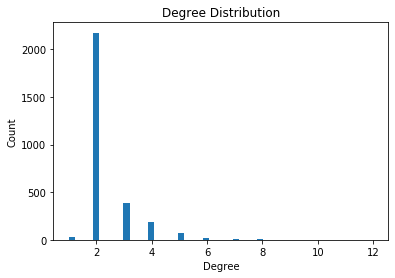

Top 10 Hubs by Degree Centrality:


,stop_id,degree_centrality,stop_name,stop_lat,stop_lon
0,13450,0.004151,Ridge Street Terminal,43.310816,-73.643825
1,7175,0.003805,Crossgates Mall Station,42.687953,-73.850299
2,3940,0.003459,Broadway & Steuben St,42.651258,-73.749925
3,10868,0.003459,Empire State Plaza Concourse,42.650790,-73.761390
4,7216,0.003113,SUNY Collins Circle,42.688238,-73.822915
5,877,0.002767,Allen/Madison Station - Western Ave & S. Allen St,42.666410,-73.791680
6,889,0.002767,Allen/Madison Station - Western Ave & S. Allen St,42.666560,-73.791700
7,3239,0.002767,Lark/Library Station - Washington Ave & Lark St,42.656161,-73.762142
8,7116,0.002767,Congress Station- 3rd St & Congress St,42.729008,-73.690805
9,9037,0.002767,Defreestville Park & Ride,42.652100,-73.696240


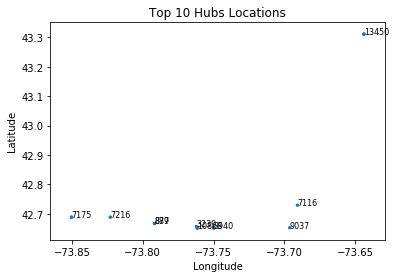

Dynamic Edges and Density by Day/Hour:


,day,hour,num_edges,density
0,weekday,6,2229,0.000533
1,weekday,5,1334,0.000319
2,weekday,7,2775,0.000664
3,weekday,8,2516,0.000602
4,weekday,13,2380,0.000569
...,...,...,...,...
65,sunday,4,72,0.000017
66,sunday,5,213,0.000051
67,sunday,1,59,0.000014
68,weekday,3,18,0.000004


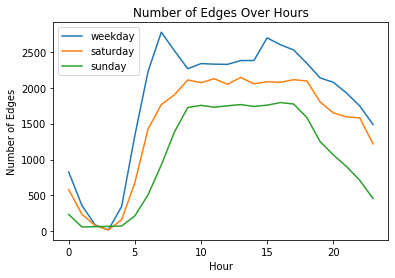

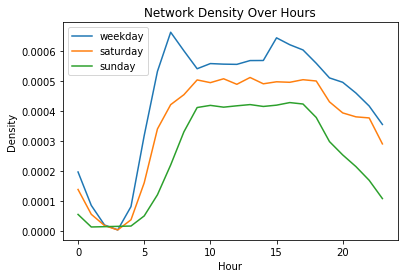

Summary Stats by Day Type:


day    num_edges         density          
                    mean   max      mean       max
0  saturday  1484.041667  2144  0.000355  0.000513
1    sunday  1143.318182  1794  0.000273  0.000429
2   weekday  1835.625000  2775  0.000439  0.000664

In [14]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from IPython.display import display

# --- 0. Helper ---
def time_to_seconds(t):
    try:
        h, m, s = map(int, t.split(':'))
        return h * 3600 + m * 60 + s
    except:
        return None

# --- 1. Load GTFS data ---
stops      = pd.read_csv('gtfs/stops.txt')
stop_times = pd.read_csv('gtfs/stop_times.txt')
trips      = pd.read_csv('gtfs/trips.txt')
calendar   = pd.read_csv('gtfs/calendar.txt')

# --- 2. Map service_id to day type ---
day_map = {}
for _, r in calendar.iterrows():
    sid = r['service_id']
    if r['sunday'] == 1:
        day_map[sid] = 'sunday'
    elif r['saturday'] == 1:
        day_map[sid] = 'saturday'
    else:
        day_map[sid] = 'weekday'

# --- 3. Prepare template graph (nodes) ---
template = nx.DiGraph()
for _, r in stops.iterrows():
    template.add_node(r['stop_id'],
                      stop_name=r['stop_name'],
                      lat=r['stop_lat'],
                      lon=r['stop_lon'])

# --- 4. Build dynamic snapshots ---
snapshots = {}
stop_times_sorted = stop_times.sort_values(['trip_id','stop_sequence'])
for tid, grp in stop_times_sorted.groupby('trip_id'):
    sid = trips.loc[trips['trip_id'] == tid, 'service_id'].iloc[0]
    day = day_map.get(sid, 'weekday')
    grp = grp.reset_index(drop=True)
    for i in range(len(grp) - 1):
        cur, nxt = grp.iloc[i], grp.iloc[i+1]
        d_sec = time_to_seconds(cur['departure_time'])
        a_sec = time_to_seconds(nxt['arrival_time'])
        if d_sec is None or a_sec is None:
            continue
        hr = (d_sec // 3600) % 24
        key = (day, hr)
        if key not in snapshots:
            G = nx.DiGraph()
            for n, data in template.nodes(data=True):
                G.add_node(n, **data)
            snapshots[key] = G
        G = snapshots[key]
        u, v = cur['stop_id'], nxt['stop_id']
        if G.has_edge(u, v):
            G[u][v]['trip_count'] += 1
            G[u][v]['time_sum'] += (a_sec - d_sec)
        else:
            G.add_edge(u, v,
                       trip_count=1,
                       time_sum=(a_sec - d_sec))

# --- 5. Compute avg_travel_time in each snapshot ---
for G in snapshots.values():
    for u, v, data in G.edges(data=True):
        data['avg_travel_time'] = data['time_sum'] / data['trip_count']

# --- 6. Aggregate snapshots into one weighted graph ---
agg = nx.DiGraph()
for n, data in template.nodes(data=True):
    agg.add_node(n, **data)
for G in snapshots.values():
    for u, v, d in G.edges(data=True):
        cnt, tsum = d['trip_count'], d['time_sum']
        if agg.has_edge(u, v):
            agg[u][v]['trip_count'] += cnt
            agg[u][v]['time_sum'] += tsum
        else:
            agg.add_edge(u, v,
                         trip_count=cnt,
                         time_sum=tsum)
# finalize average travel time
for u, v, data in agg.edges(data=True):
    data['avg_travel_time'] = data['time_sum'] / data['trip_count']

# convert to undirected for analysis
g_und = agg.to_undirected()

# --- A. Histogram of degree distribution ---
deg_seq = [d for _, d in g_und.degree()]
plt.figure()
plt.hist(deg_seq, bins=50)
plt.title("Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("Count")
plt.show()

# --- B. Top 10 hubs and map ---
deg_cent = nx.degree_centrality(g_und)
top10 = sorted(deg_cent.items(), key=lambda x: x[1], reverse=True)[:10]
df_top = pd.DataFrame(top10, columns=["stop_id","degree_centrality"])
df_top = df_top.merge(stops[['stop_id','stop_name','stop_lat','stop_lon']], on='stop_id')
print("Top 10 Hubs by Degree Centrality:")
display(df_top)

# scatter plot of top hubs
plt.figure()
plt.scatter(df_top['stop_lon'], df_top['stop_lat'], s=df_top['degree_centrality']*2000)
for _, row in df_top.iterrows():
    plt.text(row['stop_lon'], row['stop_lat'], row['stop_id'], fontsize=8)
plt.title("Top 10 Hubs Locations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# --- C. Dynamic analysis over time ---
records = []
for (day, hr), G in snapshots.items():
    ug = G.to_undirected()
    records.append({
        "day":      day,
        "hour":     hr,
        "num_edges": ug.number_of_edges(),
        "density":  nx.density(ug)
    })
df_dyn = pd.DataFrame(records)
print("Dynamic Edges and Density by Day/Hour:")
display(df_dyn)

# plot edges count over hours
plt.figure()
for day in df_dyn['day'].unique():
    df_day = df_dyn[df_dyn['day']==day].sort_values('hour')
    plt.plot(df_day['hour'], df_day['num_edges'], label=day)
plt.title("Number of Edges Over Hours")
plt.xlabel("Hour")
plt.ylabel("Number of Edges")
plt.legend()
plt.show()

# plot density over hours
plt.figure()
for day in df_dyn['day'].unique():
    df_day = df_dyn[df_dyn['day']==day].sort_values('hour')
    plt.plot(df_day['hour'], df_day['density'], label=day)
plt.title("Network Density Over Hours")
plt.xlabel("Hour")
plt.ylabel("Density")
plt.legend()
plt.show()

# --- D. Compare days: summary statistics ---
summary = df_dyn.groupby('day')[['num_edges','density']].agg(['mean','max']).reset_index()
print("Summary Stats by Day Type:")
display(summary)
